In [1]:
import cv2, os
import numpy as np, pandas as pd
from sklearn.metrics import precision_score, recall_score, jaccard_score
import imutils
import matplotlib.pyplot as plt
import os

### Haar


In [2]:
def detectar_humanos_haar(imagen):
    # Cargar el clasificador de Haar para detección de cuerpo humano
    cascada_cuerpo = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_fullbody.xml')

    # Convertir la imagen a escala de grises
    gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

    # Detectar cuerpos
    fullbodies = cascada_cuerpo.detectMultiScale(gris, scaleFactor=1.03, minNeighbors=5, minSize=(30, 30))

    # Aplicar filtro por área mínima
    fullbodies = filtro_por_area(fullbodies, min_area=200)

    # Aplicar filtro por relación altura-ancho mínima
    fullbodies = filtro_por_relacion(fullbodies, min_relacion=0.3)

    # Dibujar rectángulos alrededor de los cuerpos detectados
    for (x, y, w, h) in fullbodies:
        cv2.rectangle(imagen, (x, y), (x+w, y+h), (0, 255, 0), 2)

    return imagen

def filtro_por_area(regiones, min_area):
    # Aplicar filtro por área mínima
    regiones_filtradas = []
    for (x, y, w, h) in regiones:
        if w * h >= min_area:
            regiones_filtradas.append((x, y, w, h))
    return regiones_filtradas

def filtro_por_relacion(regiones, min_relacion):
    # Aplicar filtro por relación altura-ancho mínima
    regiones_filtradas = []
    for (x, y, w, h) in regiones:
        relacion = h / w
        if relacion >= min_relacion:
            regiones_filtradas.append((x, y, w, h))
    return regiones_filtradas


In [3]:
def mostrar_imagen(imagen):
    plt.imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

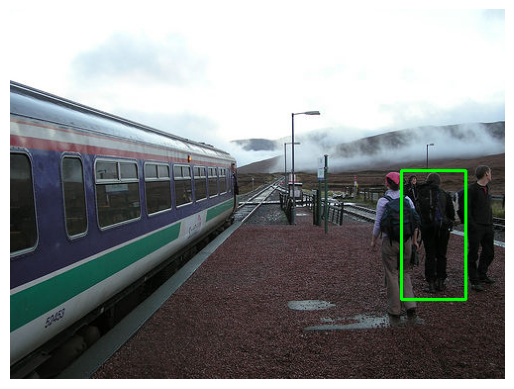

In [6]:
imagen = cv2.imread('Imagenes/25.jpeg')
imagen_detectada = detectar_humanos_haar(imagen)
mostrar_imagen(imagen_detectada)


### Hog

In [4]:
def detectar_humanos(imagen_path):
    # Configurar el detector HOG
    hog = cv2.HOGDescriptor()
    hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

    # Leer la imagen y redimensionar para una mejor eficiencia de detección
    imagen = cv2.imread(imagen_path)
    # imagen = imutils.resize(imagen, width=min(1000, imagen.shape[1]))

    # Detectar humanos en la imagen
    (humanos, _) = hog.detectMultiScale(imagen, winStride=(5, 5), padding=(16, 16), scale=1.05)

    # Dibujar rectángulos alrededor de los humanos detectados
    for (x, y, w, h) in humanos:
        cv2.rectangle(imagen, (x, y), (x+w, y+h), (0, 255, 0), 2)

    return imagen

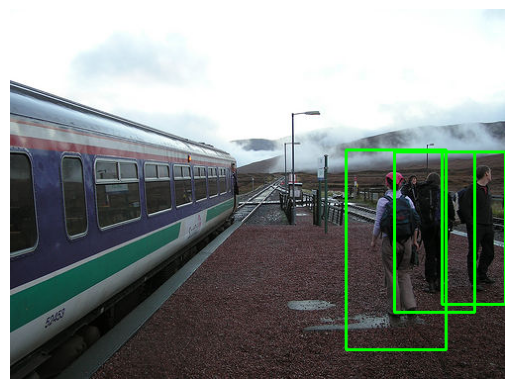

In [8]:
imagen_resultante = detectar_humanos('Imagenes/25.jpeg')
# Mostrar la imagen resultante usando matplotlib
mostrar_imagen(imagen_resultante)

In [5]:
def mostrar_imagenes_en_grid(images, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5))
    for i, ax in enumerate(axes.flat):
        ax.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        ax.axis('off')
    plt.tight_layout()
    plt.show()

folder_path = './Dataset/'
images = []
counter = 0

## Métricas para Haar

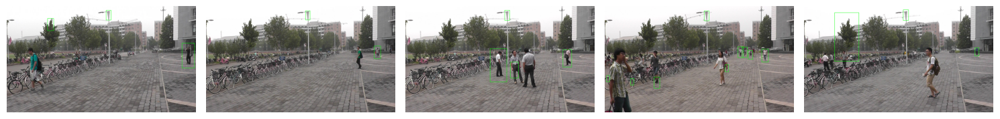

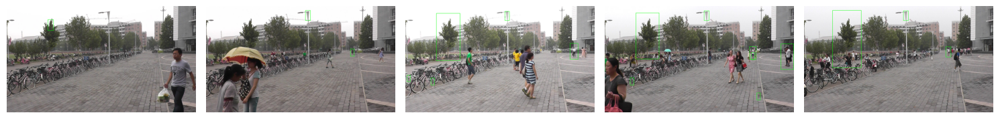

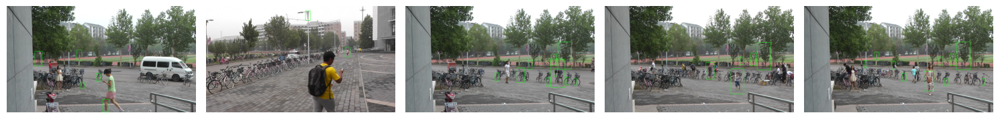

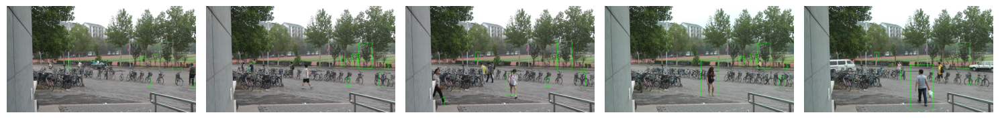

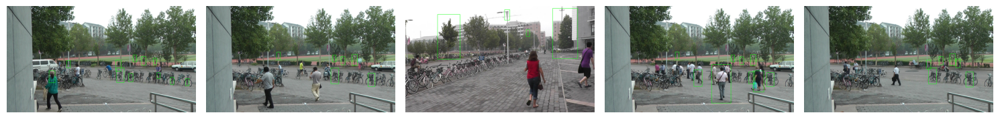

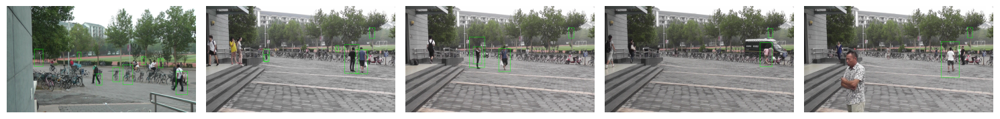

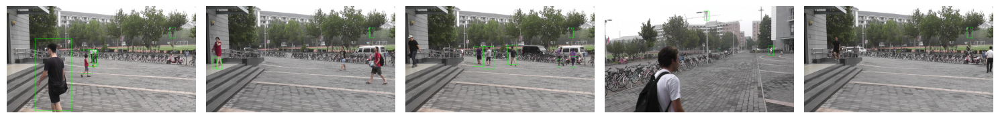

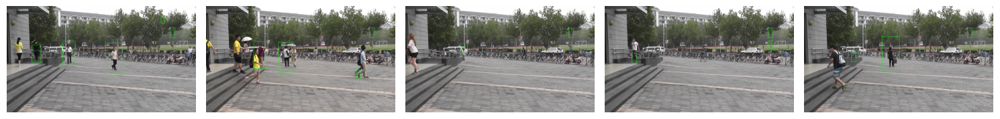

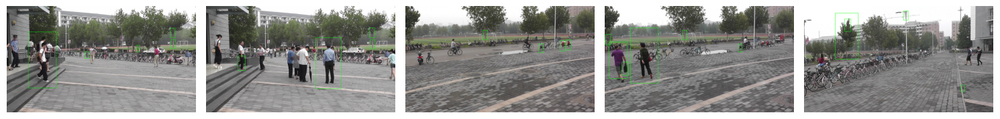

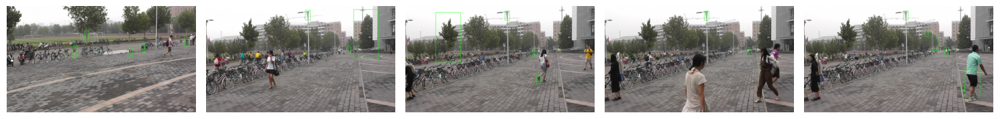

In [14]:
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(folder_path, filename)
        image = cv2.imread(image_path)
        imagen = detectar_humanos_haar(image)
        images.append(imagen)
        counter += 1
        if counter == 5:
            mostrar_imagenes_en_grid(images, 1, 5)
            images = []
            counter = 0

if counter > 0:
    mostrar_imagenes_en_grid(images, 1, counter)

In [7]:
df_haar = pd.read_csv('./Dataset/test_haar.csv')
df_haar

,Imagen,Total,TP,FP,FN
0,1,2,1,2,1
1,10,3,1,1,2
2,11,4,3,1,1
3,12,8,4,4,4
4,13,5,1,2,4
5,14,1,0,1,1
6,15,4,0,2,4
7,16,6,1,3,5
8,17,11,2,3,9
9,18,8,1,2,7


In [8]:
# Calcular la precisión
precision_haar = np.where((df_haar['TP'] + df_haar['FP']) == 0, 0, df_haar['TP'] / (df_haar['TP'] + df_haar['FP']))

# Calcular la sensibilidad (recall)
recall_haar = df_haar['TP'] / (df_haar['TP'] + df_haar['FN'])

# Calcular el índice de similitud de Jaccard
jaccard_haar = df_haar['TP'] / (df_haar['TP'] + df_haar['FP'] + df_haar['FN'])

# Calcular las medias globales
precision_global_haar = np.mean(precision_haar) * 100
recall_global_haar = np.mean(recall_haar) * 100
jaccard_global_haar = np.mean(jaccard_haar) * 100

# Imprimir las medias globales en formato de porcentaje con dos decimales
print("Media global de precisión: {:.2f}%".format(precision_global_haar))
print("Media global de sensibilidad (Recall): {:.2f}%".format(recall_global_haar))
print("Media global del índice de similitud de Jaccard: {:.2f}%".format(jaccard_global_haar))

Media global de precisión: 26.89%
Media global de sensibilidad (Recall): 26.00%
Media global del índice de similitud de Jaccard: 15.82%


## Métricas para HOG

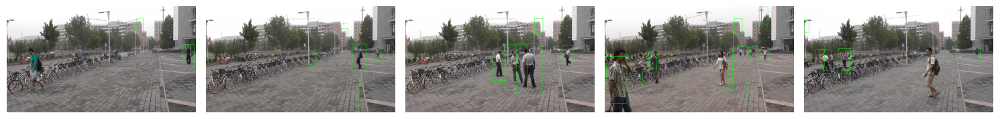

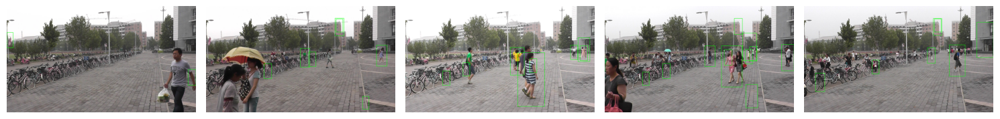

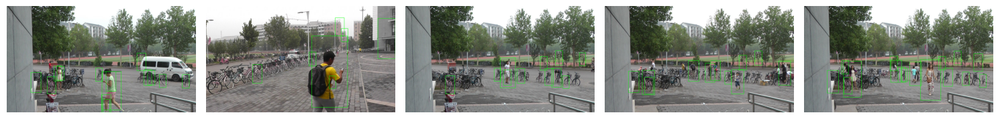

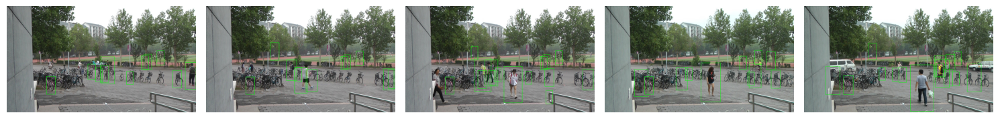

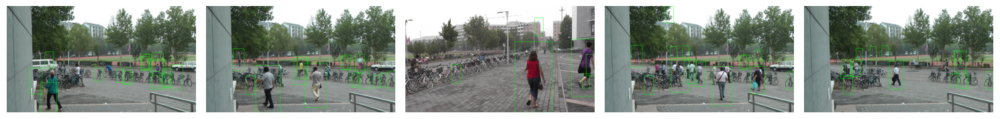

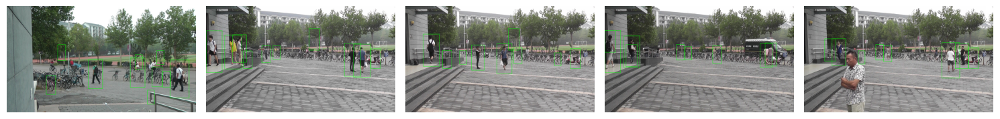

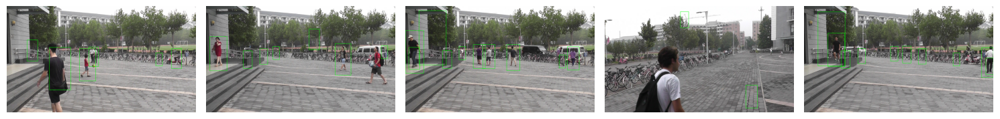

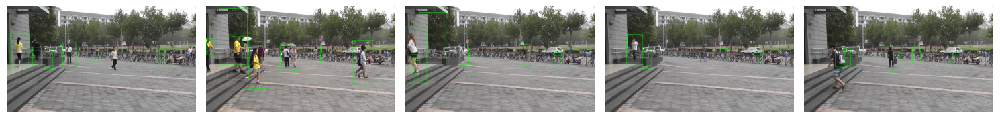

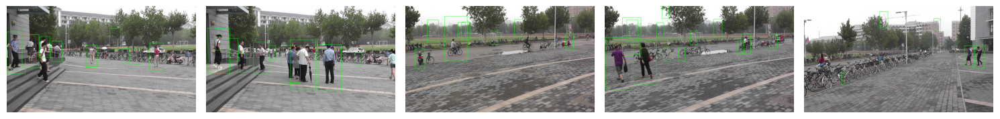

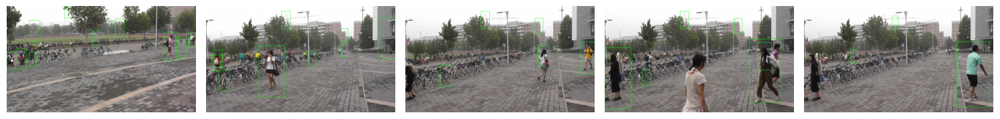

In [10]:
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(folder_path, filename)
        imagen = detectar_humanos(image_path)
        images.append(imagen)
        counter += 1
        if counter == 5:
            mostrar_imagenes_en_grid(images, 1, 5)
            images = []
            counter = 0

if counter > 0:
    mostrar_imagenes_en_grid(images, 1, counter)

In [11]:
df = pd.read_csv('./Dataset/test.csv')
df

,Imagen,Total,TP,FP,FN
0,1,2,1,0,1
1,10,3,2,0,1
2,11,4,4,1,0
3,12,6,4,4,2
4,13,5,3,0,2
5,14,1,0,0,1
6,15,4,1,1,3
7,16,6,4,2,2
8,17,11,5,0,6
9,18,8,1,0,7


In [12]:
# Calcular la precisión
precision = np.where((df['TP'] + df['FP']) == 0, 0, df['TP'] / (df['TP'] + df['FP']))

# Calcular la sensibilidad (recall)
recall = df['TP'] / (df['TP'] + df['FN'])

# Calcular el índice de similitud de Jaccard
jaccard = df['TP'] / (df['TP'] + df['FP'] + df['FN'])

# Calcular las medias globales
precision_global = np.mean(precision) * 100
recall_global = np.mean(recall) * 100
jaccard_global = np.mean(jaccard) * 100

# Imprimir las medias globales en formato de porcentaje con dos decimales
print("Media global de precisión: {:.2f}%".format(precision_global))
print("Media global de sensibilidad (Recall): {:.2f}%".format(recall_global))
print("Media global del índice de similitud de Jaccard: {:.2f}%".format(jaccard_global))

Media global de precisión: 51.90%
Media global de sensibilidad (Recall): 53.02%
Media global del índice de similitud de Jaccard: 35.55%
